In [ ]:
import numpy as np
def worldtocam(cam_coord, cam_rotation, worldcoord):
    rx = np.array([[1,0,0],[0,np.cos(cam_rotation[0]),-np.sin(cam_rotation[0])],[0,np.sin(cam_rotation[0]),np.cos(cam_rotation[0])]])
    ry = np.array([[np.cos(cam_rotation[1]),0,np.sin(cam_rotation[1])],[0,1,0],[-np.sin(cam_rotation[1]),0,np.cos(cam_rotation[1])]])
    rz = np.array([[np.cos(cam_rotation[2]),-np.sin(cam_rotation[2]),0],[np.sin(cam_rotation[2]),np.cos(cam_rotation[2]),0],[0,0,1]])
    cam_rotation = rx.dot(ry).dot(rz)
    cam_rotation=cam_rotation.T
    return cam_rotation.dot((worldcoord-cam_coord).T).T

def camtoscreen(camspace_coord,focus=935.3074360871937,screen_w=1920,screen_h=1080):
    camspace_coord = camspace_coord[camspace_coord[:,1]>0]
    cam_coord = np.array([camspace_coord[:,0]/camspace_coord[:,1]*focus+screen_w/2,-camspace_coord[:,2]/camspace_coord[:,1]*focus+screen_h/2])
    return cam_coord

def worldtoscreen(cam_coord, cam_rotate, worldcoord,focus=935.3074360871937,screen_w=1920,screen_h=1080):
    return camtoscreen(worldtocam(cam_coord, cam_rotate,worldcoord),focus,screen_w,screen_h)


98 1118 1068
==> Average min error: 15.23469387755102MS
==> Average min error: 0.0MS
==> Max error: 178MS in frame0


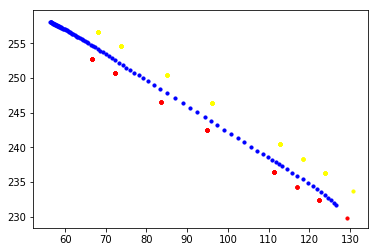

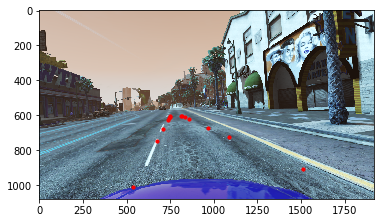

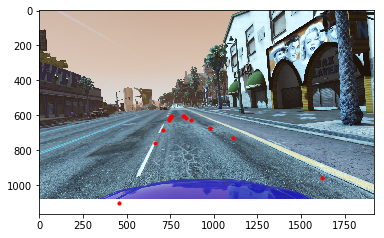

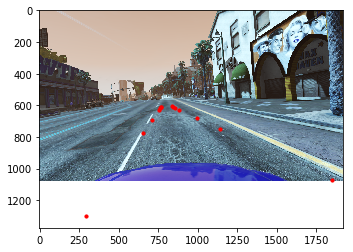

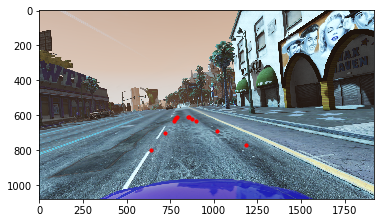

...

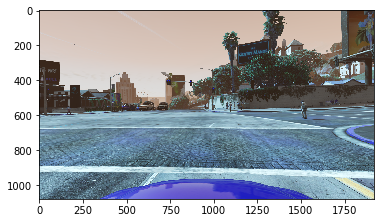

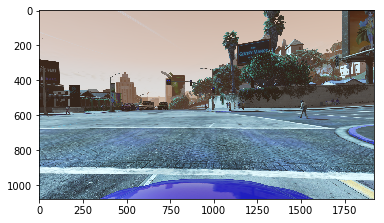

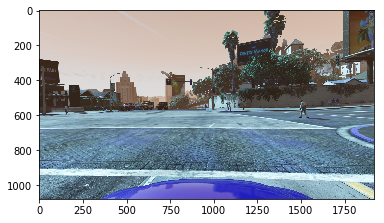

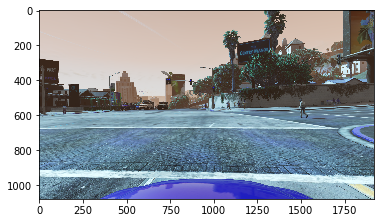

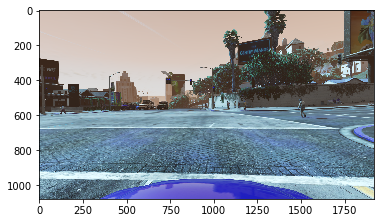

In [2]:
    from utils.data_utils import find_time_match_info
    root = "H:\\raw_ims\\rec_01201817_clear_16h4m_x4131y4271"
    imgname = 1516315098656
    find_time_match_info(root)
    import pickle
    import numpy as np
    import skimage
    from skimage import data
    from matplotlib import pyplot as plt
    from os.path import join
    import cv2

    with open(join(root, "info_match.p"), 'rb') as pickle_file:
        info = pickle.load(pickle_file)
    from utils.roadinfoparser import parseroadinfo
    left = []
    right = []
    for imgname in info:
        roadinfo = parseroadinfo(info[imgname]['roadinfo'])
        if "rightroadpointX" in roadinfo:
            leftpoint = np.array(roadinfo['leftroadpoint'])
            rightpoint = np.array(roadinfo['rightroadpointX'])
            if len(left) > 0:
                if np.sum(left[-1] - leftpoint) != 0 or np.sum(right[-1] - rightpoint) != 0:
                    head = left[-1] - right[-1]
                    if head.dot((leftpoint - rightpoint).T) > 0:
                        left.append(leftpoint)
                        right.append(rightpoint)
                    else:
                        left.append(rightpoint)
                        right.append(leftpoint)
            else:
                left.append(leftpoint)
                right.append(rightpoint)
            plt.scatter(left[-1][0], left[-1][1], s=10, c='red', marker='o')
            plt.scatter(right[-1][0], right[-1][1], s=10, c='yellow', marker='o')
        plt.scatter([info[imgname]['location'][0]], [info[imgname]['location'][1]], s=10, c='blue', marker='o')
    plt.show()
    left = np.array(left)
    right = np.array(right)

    for imgname in info:
        img = cv2.imread(join(root,str(imgname)+"_final.png"))
        cam_coords = info[imgname]['cam_coords']
        cam_rotation = np.array(info[imgname]['cam_rotation'])*np.pi/180
        left_screen = worldtoscreen(cam_coords,cam_rotation,left)
        right_screen = worldtoscreen(cam_coords,cam_rotation,right)
        plt.imshow(img)
        left_screen = left_screen[:,(left_screen[0]<2000)*(left_screen[0]>0)]
        right_screen = right_screen[:,(right_screen[0]<2000)*(right_screen[0]>0)]
        plt.scatter(left_screen[0],left_screen[1],s=10, c='red', marker='o')
        plt.scatter(right_screen[0],right_screen[1],s=10, c='red', marker='o')
        plt.show()